# 출처는 원주 기술코치 박성호ㅋ
## 사본저장하고 사본으로 돌리는 것을 권장티비
* 참고한 코드 : https://www.kaggle.com/code/prathameshchaudhari/wine-quality-classification-0-85-accuracy/notebook
* 데이터 출처 : https://www.kaggle.com/code/prathameshchaudhari/wine-quality-classification-0-85-accuracy/data

### 위의 코드를 참고하고 나의 코드와 결합해서 만든 미니 프젝임

# 라이브러리

In [4]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20170925-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent

Text(0.5, 1.0, '안녕')

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50504 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45397 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 50504 missing from current font.
  font.set_text(s, 0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 45397 missing from current font.
  font.set_text(s, 0, flags=flags)


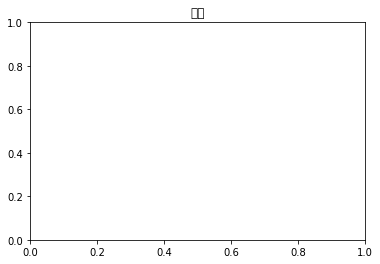

In [5]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic') 
plt.title('안녕')

In [6]:
import io
import pandas as pd
df = pd.read_csv('water_potability.csv')
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


In [7]:
# Basic Libraries
import numpy as np
import pandas as pd
from warnings import filterwarnings
from collections import Counter

# Visualizations Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objs as go
pyo.init_notebook_mode()
import plotly.figure_factory as ff
import missingno as msno

# Data Pre-processing Libraries
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split

# Modelling Libraries
from sklearn.linear_model import LogisticRegression,RidgeClassifier,SGDClassifier,PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC,LinearSVC,NuSVC
from sklearn.neighbors import KNeighborsClassifier,NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from lightgbm import LGBMClassifier
# Evaluation & CV Libraries
from sklearn.metrics import precision_score,accuracy_score, classification_report, plot_confusion_matrix, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,RepeatedStratifiedKFold


# 변수 설명
* ph: pH of 1. water (0 to 14).

* Hardness: Capacity of water to precipitate soap in mg/L.

* Solids: Total dissolved solids in ppm.

* Chloramines: Amount of Chloramines in ppm.

* Sulfate: Amount of Sulfates dissolved in mg/L.

* Conductivity: Electrical conductivity of water in μS/cm.

* Organic_carbon: Amount of organic carbon in ppm.

* Trihalomethanes: Amount of Trihalomethanes in μg/L.

* Turbidity: Measure of light emiting property of water in NTU.

* Potability: Indicates if water is safe for human consumption. Potable - 1 and Not potable - 0

# Importing The Dataset


In [8]:
#코랩에서는 이렇게 가져오면 안됌ㅋㅋ
#df = pd.read_csv('C:/Users/USER/Desktop/python_code/data/water_potability.csv')
#df 
# ID가 없어서 삭제 안해도 됨

In [9]:
# 결측치 확인
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [10]:
# 결측치 왜케 많아
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [11]:
# axis=0 : 결측값이 있는 행 제거
# axis=1 : 결측값이 있는 열 제거
df = df.dropna(axis=0)
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
...,...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1


In [12]:
# 결측치 제거
df = df[df.notnull()]
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
...,...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2011 entries, 3 to 3271
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2011 non-null   float64
 1   Hardness         2011 non-null   float64
 2   Solids           2011 non-null   float64
 3   Chloramines      2011 non-null   float64
 4   Sulfate          2011 non-null   float64
 5   Conductivity     2011 non-null   float64
 6   Organic_carbon   2011 non-null   float64
 7   Trihalomethanes  2011 non-null   float64
 8   Turbidity        2011 non-null   float64
 9   Potability       2011 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 172.8 KB


# 시각화

In [14]:
# 히스토그램, 박스 차트, 밀도 함수 
def feature_viz(feature):
    plt.figure(figsize=(15,8))
    plt.title(f'{feature} hist plot')
    plt.subplot(1,3,1)
    df[feature].plot(kind='hist')

    plt.subplot(1,3,2)
    plt.title(f'{feature} box plot')
    sns.boxplot(df[feature], hue=df['Potability'])
    
    plt.subplot(1, 3, 3)
    plt.title(f'{feature} density plot')
    sns.kdeplot(df[feature], hue=df['Potability'])
    plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass t

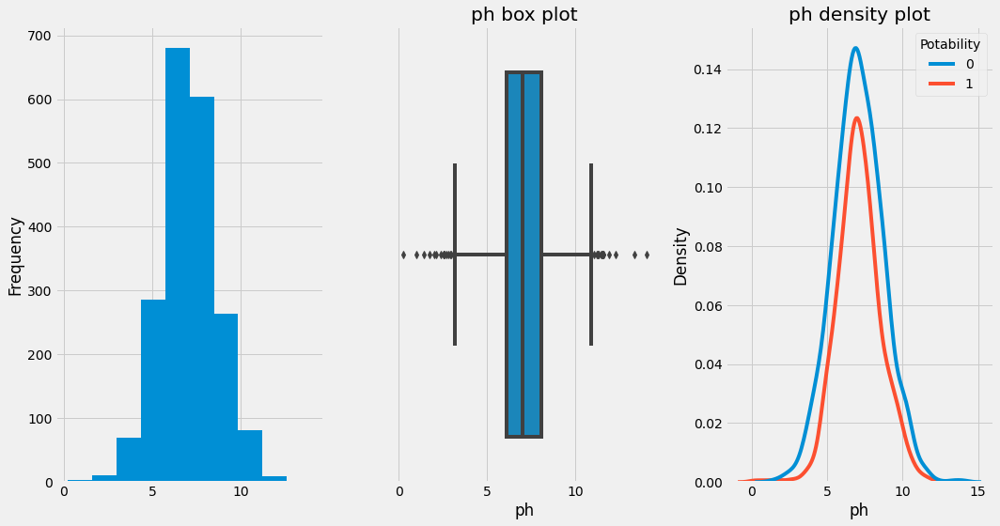

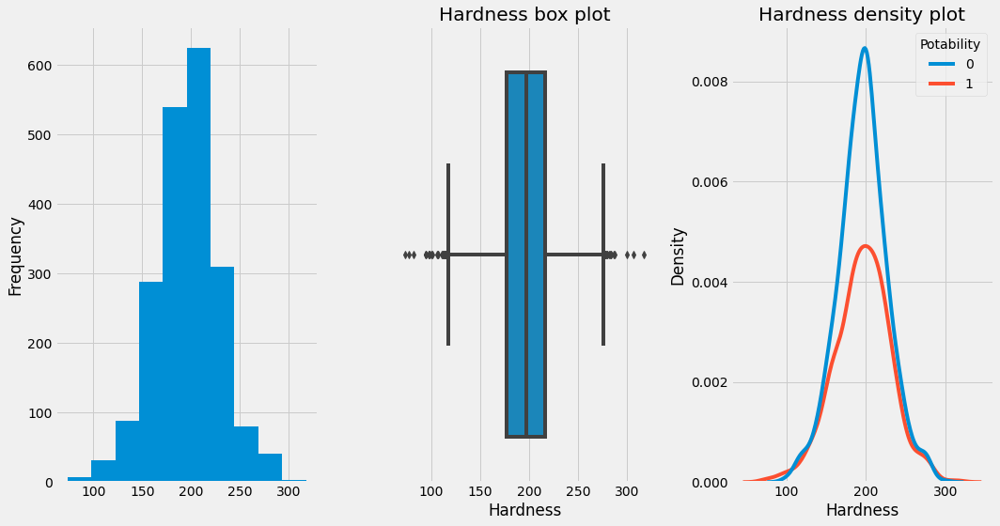

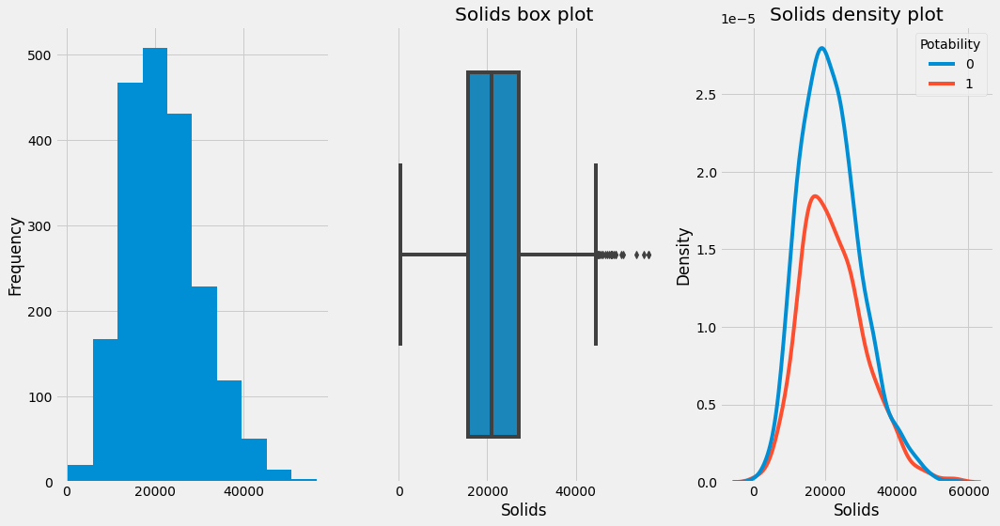

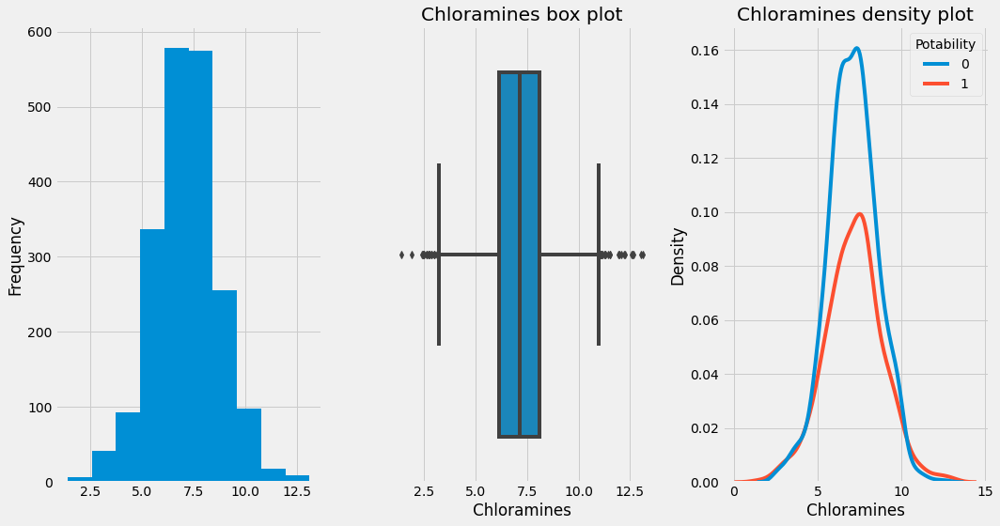

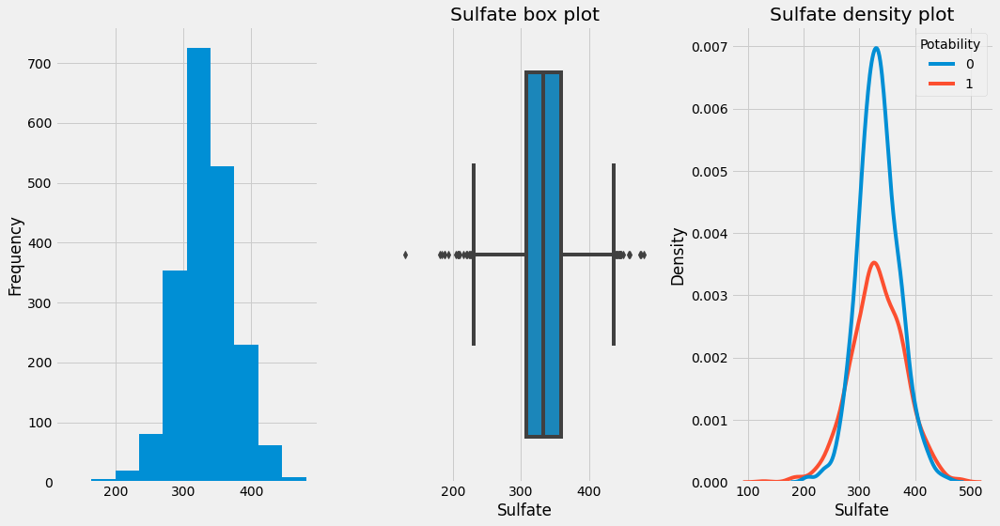

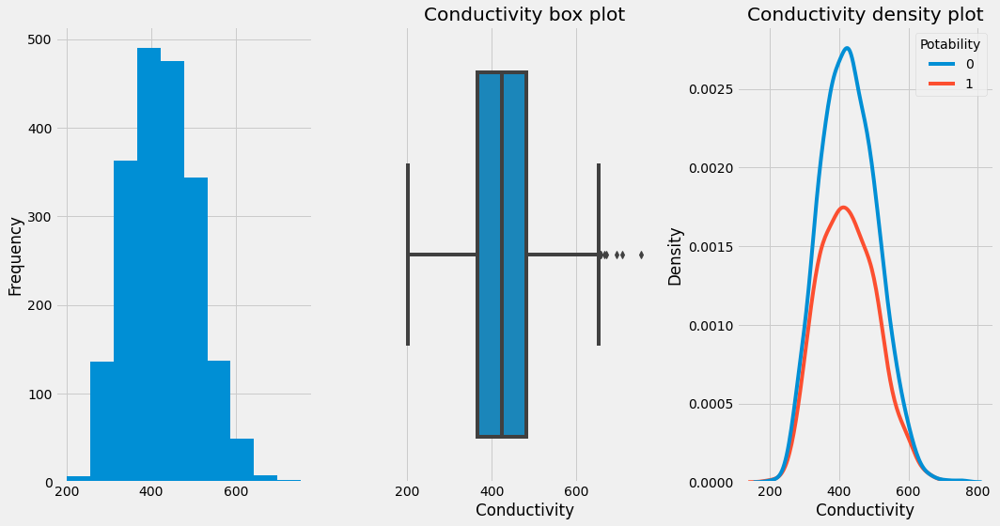

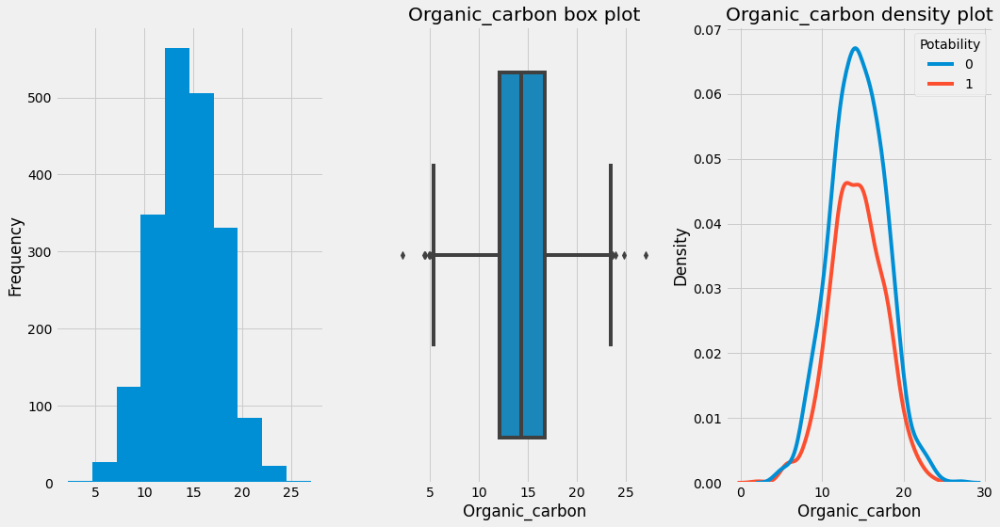

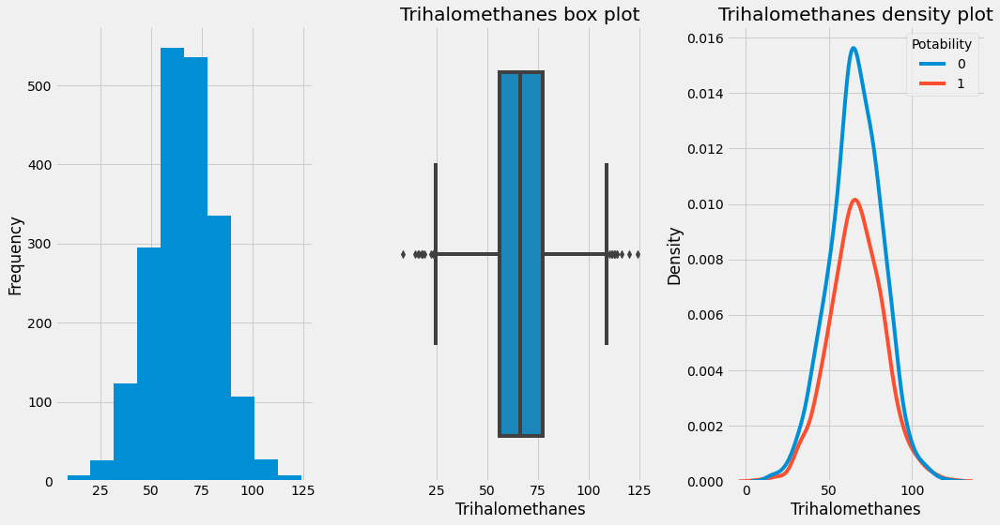

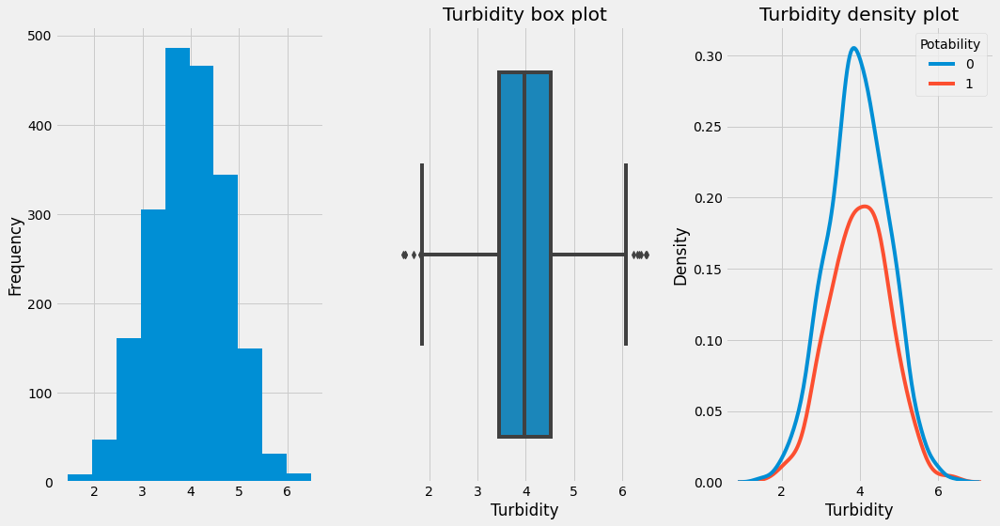

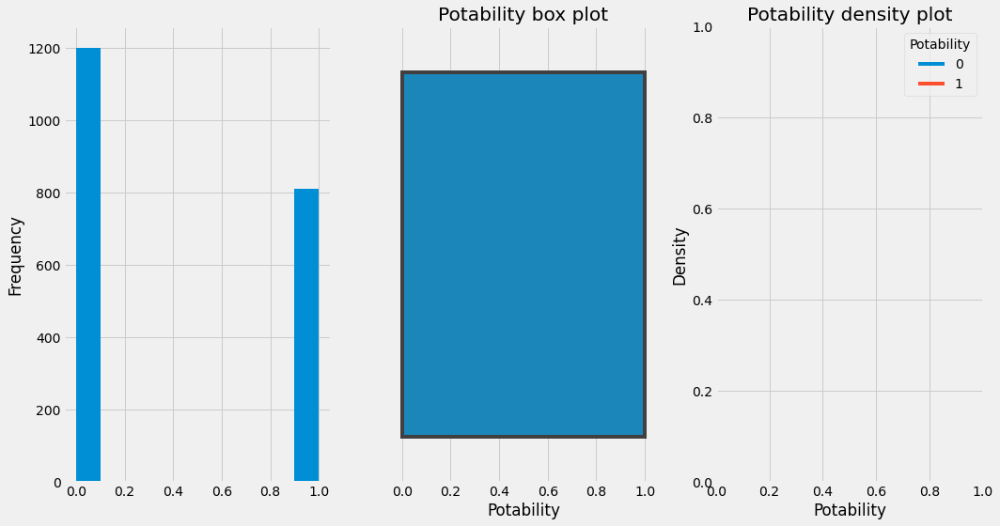

In [15]:
plt.style.use('fivethirtyeight')
for i in df.columns:
    feature_viz(i)

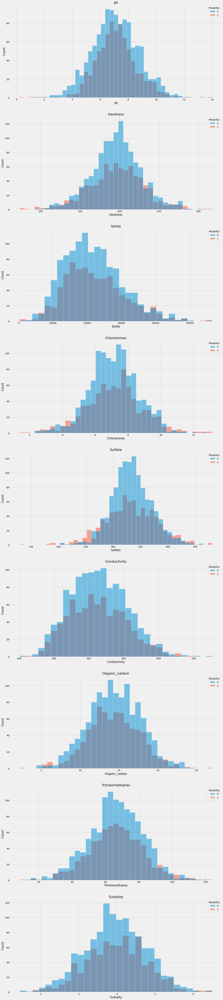

In [16]:
#독립변수 히스토그램
fig, ax =plt.subplots(9,1,figsize=(20,100))
x=0
plt.style.use('fivethirtyeight')
for i in range(0, 9):
    sns.histplot(x=df.columns[x], data=df, hue='Potability', ax=ax[i]);
    ax[i].set_title(df.columns[x])
    fig.show()
    x+=1

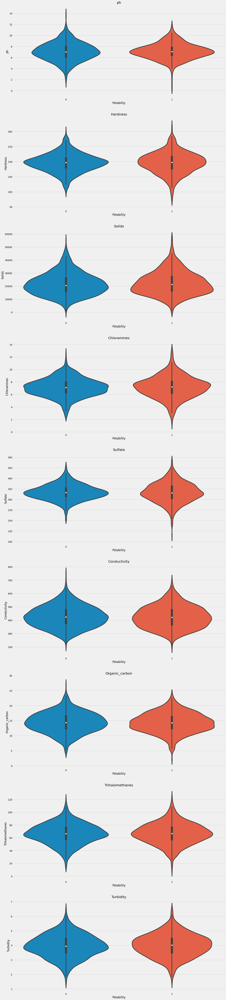

In [17]:
#독립변수 히스토그램
plt.style.use('fivethirtyeight')

fig, ax =plt.subplots(9,1,figsize=(20,100))
x=0
for i in range(0, 9):
    sns.violinplot(x = df['Potability'], y = df.columns[x], data = df, split=True, ax=ax[i]);
    ax[i].set_title(df.columns[x])
    fig.show()
    x+=1

In [18]:
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
...,...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1


In [19]:
# marginal_x, marginal_y = "rug"
import plotly.express as px
import plotly
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objs as go
pyo.init_notebook_mode()
import plotly.figure_factory as ff
px.scatter(df, x="Turbidity", y="Trihalomethanes",color='Potability' , 
           marginal_x="rug", marginal_y="rug",
           template="plotly_dark")

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

px.violin(df, x="Potability", y="ph", template="plotly_dark")

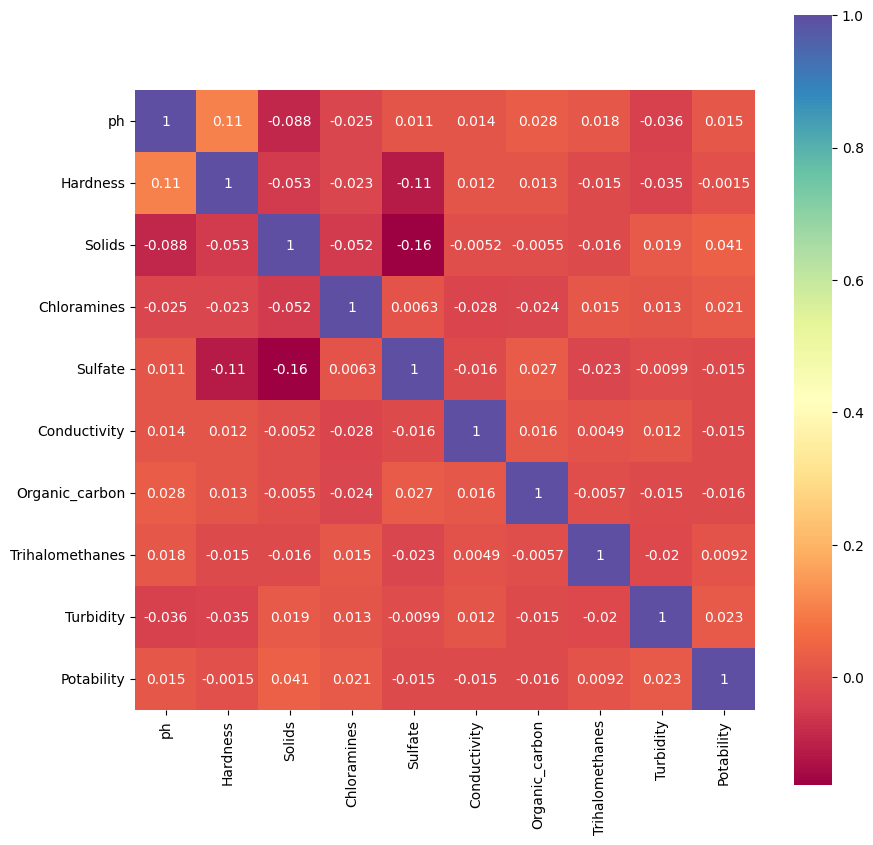

In [21]:
# 상관 행렬
plt.style.use('default')
plt.figure(figsize = (10,10))
sns.heatmap(df.corr(), cmap= 'Spectral', annot=True, square=True)

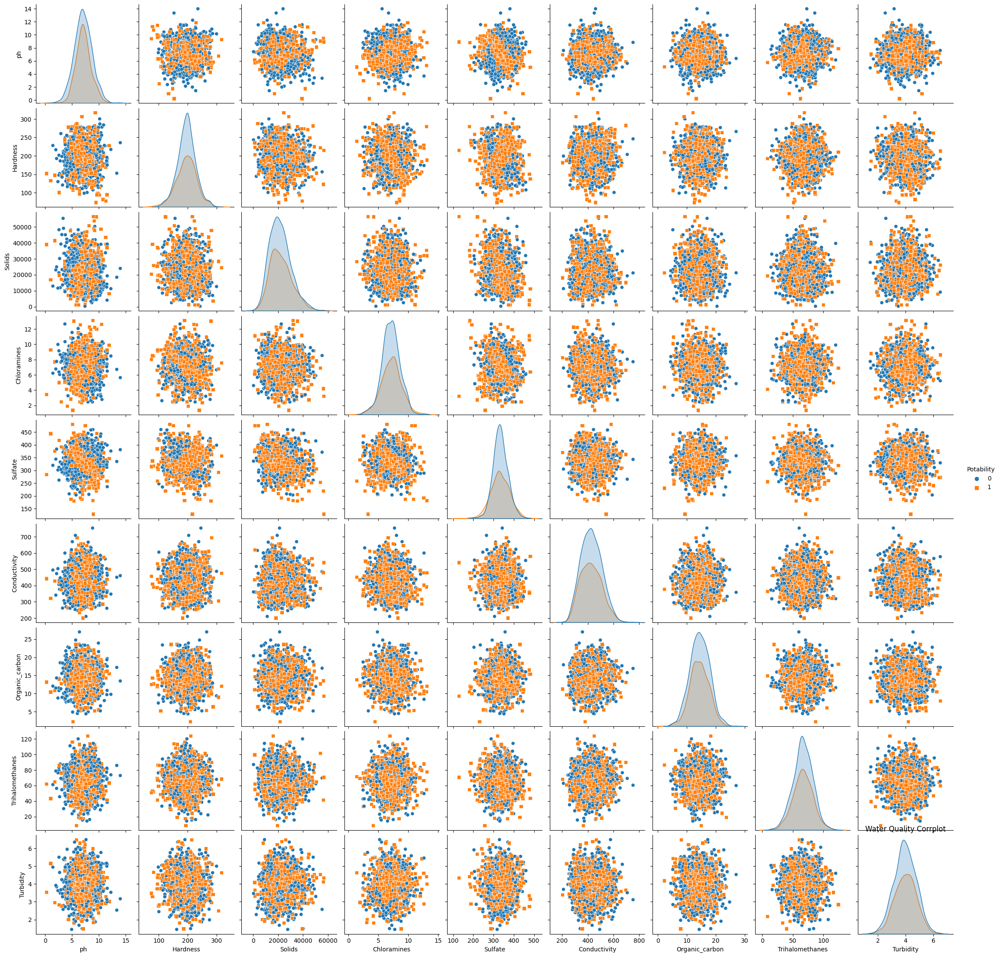

In [22]:
sns.pairplot(df, hue="Potability", markers=["o", "s"])
plt.title("Water Quality Corrplot")
plt.show()

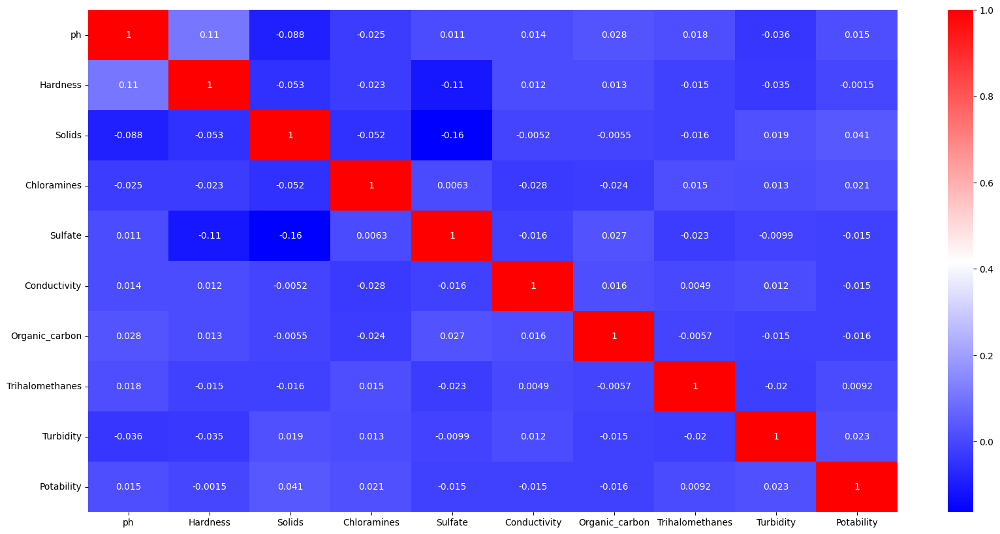

In [23]:
#상관행렬 히트맵
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(),annot=True,cmap = 'bwr')

In [24]:
# 독립변수와 종속변수 X, y에 각각 분할
X = df.drop("Potability", axis = 1)
y = df['Potability']

In [25]:
y.value_counts()

0    1200
1     811
Name: Potability, dtype: int64

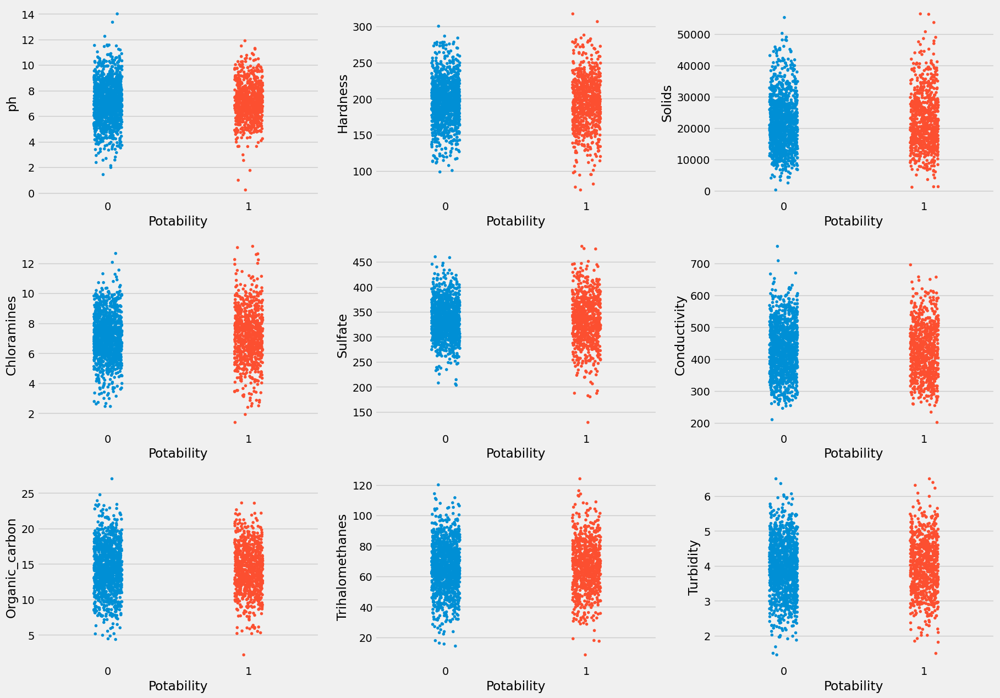

In [26]:
# X에 따른 target의 분포
plt.style.use('fivethirtyeight')
#plt.style.use('default')
import seaborn as sns
plt.figure(figsize = (20, 20))

for n, column in enumerate(X.columns):
    plt.subplot(4, 3, n + 1)
    sns.stripplot(x = y , y = X[column], size = 4)

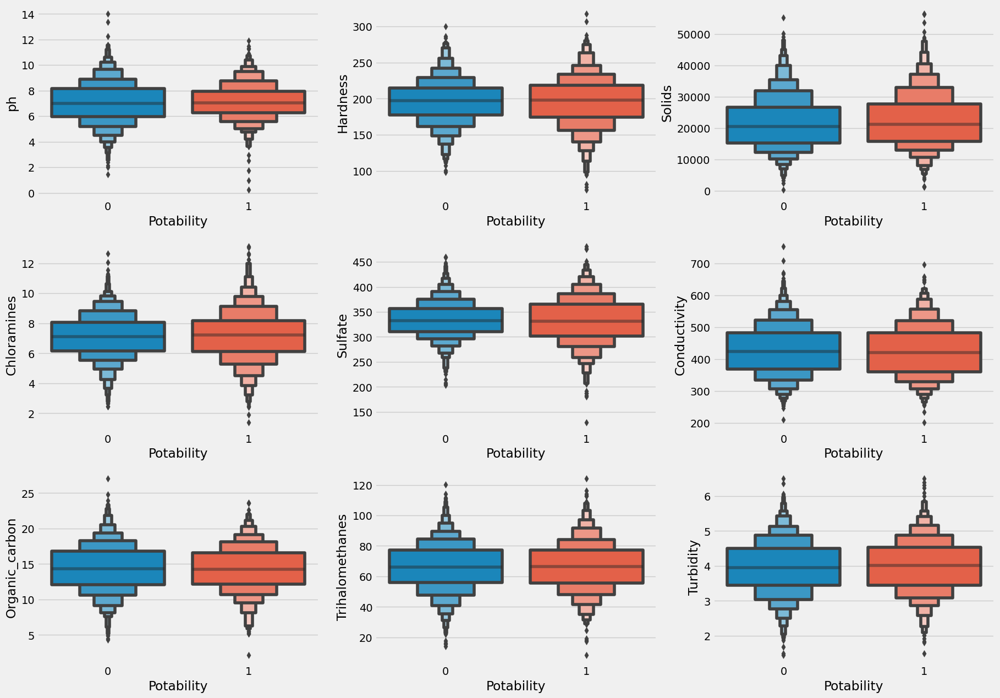

In [27]:
# X에 따른 target의 분포
import seaborn as sns
plt.style.use('fivethirtyeight')
#plt.style.use('dark_background')
plt.figure(figsize = (20, 20))

for n, column in enumerate(X.columns):
    plt.subplot(4, 3, n + 1)
    sns.boxenplot(x = y , y = X[column])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/di

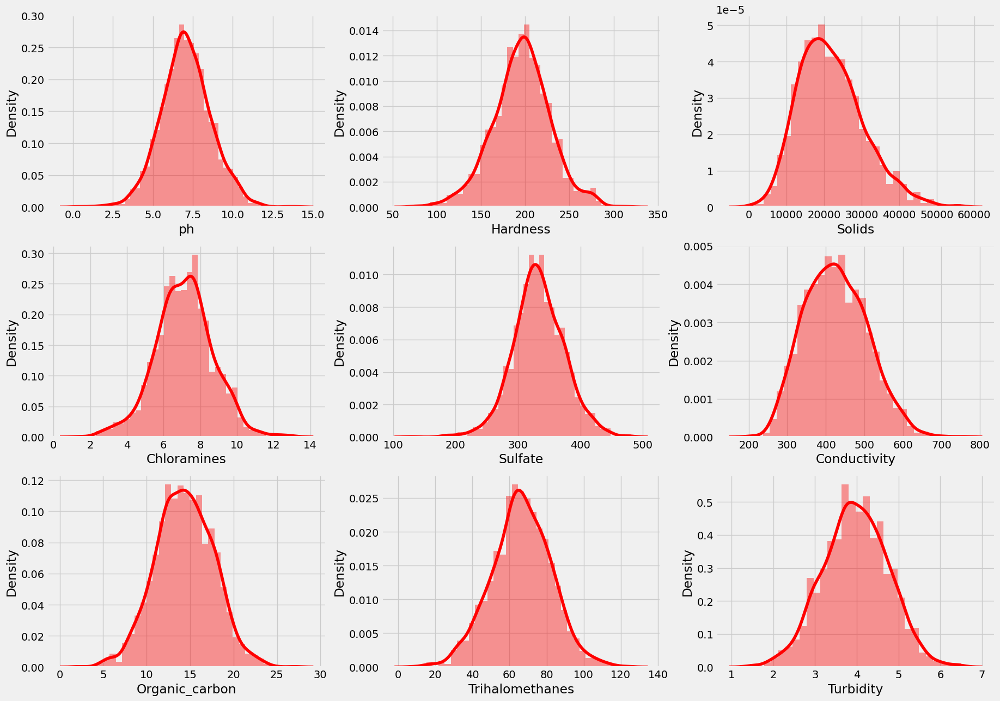

In [28]:
plt.figure(figsize = (20, 20))
for n, column in enumerate(X.columns):
    plt.subplot(4, 3, n + 1)
    sns.distplot(X[column], color = 'r')

In [29]:
X

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425
...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712


In [30]:
from sklearn.preprocessing import StandardScaler
st = StandardScaler()
col= X.columns
X[col] = st.fit_transform(X[col])
X[col]

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3,0.782466,0.564114,0.011687,0.583804,0.574378,-0.783962,1.227032,2.111652,0.844761
4,1.275463,-0.455653,-0.455835,-0.370947,-0.560480,-0.348429,-0.842154,-2.140399,0.135033
5,-0.954835,-0.234614,0.790645,0.259104,-0.158911,-1.810063,-1.792340,-0.714423,-1.807366
6,1.994902,1.596951,0.790764,0.239248,1.467140,-1.770608,-0.170876,1.132494,-1.662163
7,0.985323,0.226606,-0.954313,-1.622878,-0.726179,0.595858,-0.599824,-0.224135,0.553348
...,...,...,...,...,...,...,...,...,...
3267,1.210411,0.584770,-0.693978,-0.528284,-0.492625,-0.447578,-1.341281,-0.705001,0.825626
3268,-0.243774,0.347964,-0.540564,0.362137,-0.697038,-1.205321,0.559422,-2.334474,-0.675183
3269,2.800492,-3.100365,1.767503,1.343596,-1.803476,0.165656,0.546021,-1.545585,0.512125
3270,-0.646160,-0.285317,0.488576,0.387023,0.302843,-0.131852,-0.688929,-0.372108,-0.384562


In [31]:
# 클래스 불균형 => 업샘플링 필요
# 만약 없샘플링 안하면? 불균형한 데이터로 썻기때문에 정확도가 낮은 결과를 초래
y.value_counts()

0    1200
1     811
Name: Potability, dtype: int64

# 업샘플링 imblearn - SMOTE

In [32]:
pip install imblearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [33]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_up, y_up = oversample.fit_resample(X, y)
print(X_up.shape) 
print(y_up.value_counts())

(2400, 9)
0    1200
1    1200
Name: Potability, dtype: int64


In [34]:
# 업샘플링을 통해 생성된 y_up의 클래스 빈도확인
y_up.value_counts()

0    1200
1    1200
Name: Potability, dtype: int64

In [35]:
# ADASYN 오버 샘플링
from imblearn.over_sampling import ADASYN
oversample = ADASYN()
X_up_ada, y_up_ada = oversample.fit_resample(X, y)
print(X_up_ada.shape) 
print(y_up_ada.value_counts())

(2487, 9)
1    1287
0    1200
Name: Potability, dtype: int64


In [36]:
# ADASYN 오버샘플링 후 split - modeling
X_train_ada, X_test_ada, y_train_ada, y_test_ada = train_test_split(X_up_ada, y_up_ada, 
                                                    test_size = 0.2, stratify=y_up_ada)

rnd_clf = RandomForestClassifier()
rnd_clf.fit( X_train_ada, y_train_ada ) #학습
rnd_clf_pred = rnd_clf.predict(X_test_ada) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test_ada, y_test_ada) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train_ada, y_train_ada)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")


랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 72.69076305220884 %


In [37]:
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler()
X_up_ROS, y_up_ROS = oversample.fit_resample(X, y)
print(X_up_ROS.shape) 
print(y_up_ROS.value_counts())

(2400, 9)
0    1200
1    1200
Name: Potability, dtype: int64


In [38]:
# RandomOverSampler 오버샘플링 후 split - modeling
X_train_ROS, X_test_ROS, y_train_ROS, y_test_ROS = train_test_split(X_up_ROS, y_up_ROS, 
                                                    test_size = 0.2, stratify=y_up_ROS)

from sklearn.ensemble import RandomForestClassifier
import time
start = time.time()
rnd_clf = RandomForestClassifier()
rnd_clf.fit( X_train_ROS, y_train_ROS ) #학습
rnd_clf_pred = rnd_clf.predict(X_test_ROS) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test_ROS, y_test_ROS) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train_ROS, y_train_ROS)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")
end = time.time() 
print('Execution time is:', end - start) 

랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 75.83333333333333 %
Execution time is: 0.9252145290374756


In [39]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_up, y_up = oversample.fit_resample(X, y)
print(X_up.shape) 
print(y_up.value_counts())

(2400, 9)
0    1200
1    1200
Name: Potability, dtype: int64


In [40]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_up_smt, y_up_smt = oversample.fit_resample(X, y)
X_train_smt, X_test_smt, y_train_smt, y_test_smt = train_test_split(X_up_smt, y_up_smt, 
                                                                    test_size = 0.2, stratify=y_up_smt)

rnd_clf = RandomForestClassifier()
rnd_clf.fit( X_train_smt , y_train_smt ) #학습
rnd_clf_pred = rnd_clf.predict(X_test_smt) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test_smt, y_test_smt) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train_smt, y_train_smt)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")

랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 74.375 %


# Train Test Split

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify=y)
X_train.shape, y_train.shape

((1608, 9), (1608,))

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X_up, y_up, test_size = 0.2, 
                                                    stratify=y_up, random_state=42)
print(X_train.shape) 
print(y_train.value_counts())

(1920, 9)
1    960
0    960
Name: Potability, dtype: int64


In [43]:
# train data 클래스 빈도
y_train.value_counts()

1    960
0    960
Name: Potability, dtype: int64

In [44]:
# test data 클래스 빈도
y_test.value_counts()

1    240
0    240
Name: Potability, dtype: int64

In [45]:
from sklearn.ensemble import RandomForestClassifier
import time
start = time.time()
# 랜덤 포레스트 분류기에  500개 의사 결정 트리를 사용한다.
rnd_clf = RandomForestClassifier()
# 단어 묶음을 벡터화한 데이터와 정답 데이터를 가지고 학습을 시작한다.
rnd_clf.fit( X_train, y_train ) #학습
rnd_clf_pred = rnd_clf.predict(X_test) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test, y_test) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train, y_train)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")
end = time.time() 
print('Execution time is:', end - start) 

랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 75.83333333333333 %
Execution time is: 0.9412260055541992


In [46]:
X_train, X_test, y_train, y_test = (X_train_ROS, X_test_ROS, y_train_ROS, y_test_ROS)

In [47]:
X_train, X_test, y_train, y_test

(            ph  Hardness    Solids  Chloramines   Sulfate  Conductivity  \
 1904  1.326578 -0.928083 -1.226646    -0.325345  0.954730     -0.075562   
 554   1.980142 -0.425644 -1.608923    -0.988899  0.110618     -1.672102   
 295  -0.465928  0.315743 -0.406061    -2.152554  0.363763     -0.456587   
 239  -0.834912  0.533162  0.486973     0.944431 -1.455160      0.483724   
 412  -1.369425 -0.959369  1.069213     0.174918  1.227286      0.991480   
 ...        ...       ...       ...          ...       ...           ...   
 1373  0.164754  0.190223 -0.565349    -0.581731  0.684934      2.153467   
 1744 -0.638927 -0.415426  1.088373     0.309197 -0.352032      0.891380   
 1748  0.685345 -0.023158  0.636273    -1.086739 -2.463907      1.278376   
 226  -0.133214 -0.157034  0.007128    -0.949101  0.742981     -0.958457   
 367   0.947744  0.771821  0.344886    -0.575421  0.208388     -0.461426   
 
       Organic_carbon  Trihalomethanes  Turbidity  
 1904       -0.302169         0.40

# Random Forest

랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 73.75 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.73      0.74       240
           1       0.74      0.74      0.74       240

    accuracy                           0.74       480
   macro avg       0.74      0.74      0.74       480
weighted avg       0.74      0.74      0.74       480

--------------------------------------------------------------------------
[[176  64]
 [ 62 178]]
--------------------------------------------------------------------------
Execution time is:
0.7906949520111084


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Random Forest >>')

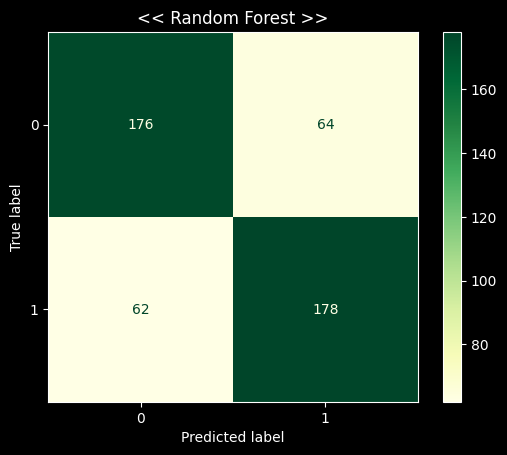

In [89]:
from sklearn.ensemble import RandomForestClassifier
import time
plt.style.use('dark_background')
start = time.time()
rnd_clf = RandomForestClassifier( random_state=0)
rnd_clf.fit( X_train_ROS, y_train_ROS ) #학습
rnd_clf_pred = rnd_clf.predict(X_test_ROS) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test_ROS, y_test_ROS) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train_ROS, y_train_ROS)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS, rnd_clf_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS, rnd_clf_pred))
print("--------------------------------------------------------------------------")
end = time.time() 
print('Execution time is:') 
print(end - start)
plot_confusion_matrix(rnd_clf, X_test_ROS, y_test_ROS, cmap='YlGn')
plt.title("<< Random Forest >>")

## 랜덤 포레스트 Main Modeling

랜덤포레스트 training accuracy  : 100.0 %
랜덤포레스트 test accuracy : 74.16666666666667 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.71      0.73       240
           1       0.73      0.77      0.75       240

    accuracy                           0.74       480
   macro avg       0.74      0.74      0.74       480
weighted avg       0.74      0.74      0.74       480

--------------------------------------------------------------------------
[[171  69]
 [ 55 185]]
--------------------------------------------------------------------------
Execution time is:
4.193528652191162


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Random Forest >>')

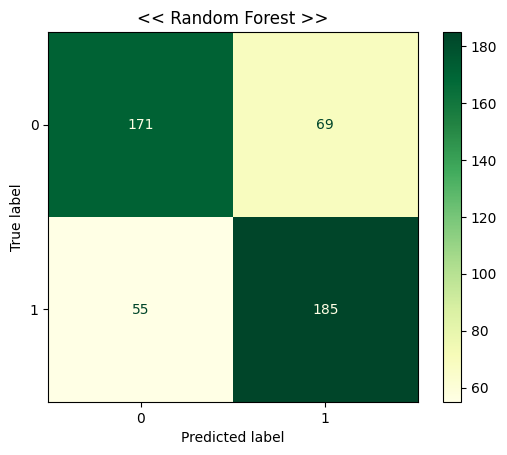

In [49]:
from sklearn.ensemble import RandomForestClassifier
import time
plt.style.use('default')
start = time.time()
rnd_clf = RandomForestClassifier(min_samples_leaf=2, n_estimators=350, random_state=42)
rnd_clf.fit( X_train_ROS, y_train_ROS ) #학습
rnd_clf_pred = rnd_clf.predict(X_test_ROS) #X_test 예측
rnd_clf_acc = rnd_clf.score(X_test_ROS, y_test_ROS) # 정확도(Accuracy) 출력 
print("랜덤포레스트 training accuracy  :", rnd_clf.score(X_train_ROS, y_train_ROS)*100, "%")
print("랜덤포레스트 test accuracy :", rnd_clf_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS, rnd_clf_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS, rnd_clf_pred))
print("--------------------------------------------------------------------------")
end = time.time() 
print('Execution time is:') 
print(end - start)
plot_confusion_matrix(rnd_clf, X_test_ROS, y_test_ROS, cmap='YlGn')
plt.title("<< Random Forest >>")

In [50]:
features = rnd_clf.feature_names_in_
features

array(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate',
       'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity'],
      dtype=object)

In [51]:
for name, importance in zip(features, rnd_clf.feature_importances_):
  print(name, "=", importance)

ph = 0.1495163362773196
Hardness = 0.11592388355794014
Solids = 0.1073128497043754
Chloramines = 0.12077649832325206
Sulfate = 0.15004062123427647
Conductivity = 0.09044272632923969
Organic_carbon = 0.09044588293006542
Trihalomethanes = 0.09000578146462582
Turbidity = 0.08553542017890542


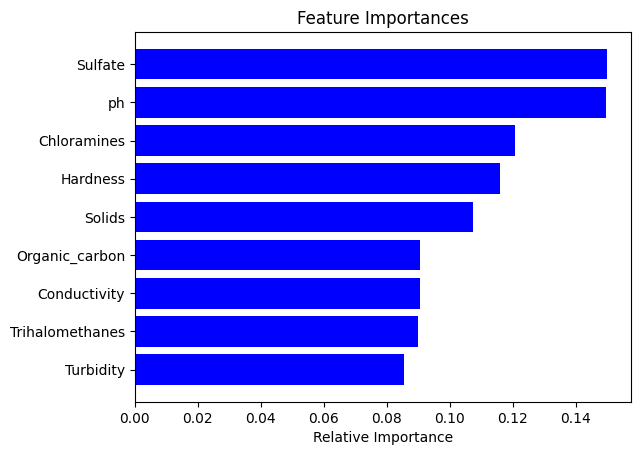

In [52]:
importances = rnd_clf.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [53]:
importances = rnd_clf.feature_importances_
indices = np.argsort(importances)
indices


array([8, 7, 5, 6, 2, 1, 3, 0, 4])

In [54]:
importances = rnd_clf.feature_importances_
importances

array([0.14951634, 0.11592388, 0.10731285, 0.1207765 , 0.15004062,
       0.09044273, 0.09044588, 0.09000578, 0.08553542])

In [55]:
start_time = time.time()
forest_importances = pd.Series(rnd_clf.feature_importances_)
forest_importances

0    0.149516
1    0.115924
2    0.107313
3    0.120776
4    0.150041
5    0.090443
6    0.090446
7    0.090006
8    0.085535
dtype: float64

In [56]:
feature_scores = pd.Series(rnd_clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

Sulfate            0.150041
ph                 0.149516
Chloramines        0.120776
Hardness           0.115924
Solids             0.107313
Organic_carbon     0.090446
Conductivity       0.090443
Trihalomethanes    0.090006
Turbidity          0.085535
dtype: float64

In [57]:
# 변수 중요도 Series 생성 후 sorting
forest_importances = pd.Series(rnd_clf.feature_importances_)
feature_scores = pd.Series(rnd_clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

Sulfate            0.150041
ph                 0.149516
Chloramines        0.120776
Hardness           0.115924
Solids             0.107313
Organic_carbon     0.090446
Conductivity       0.090443
Trihalomethanes    0.090006
Turbidity          0.085535
dtype: float64

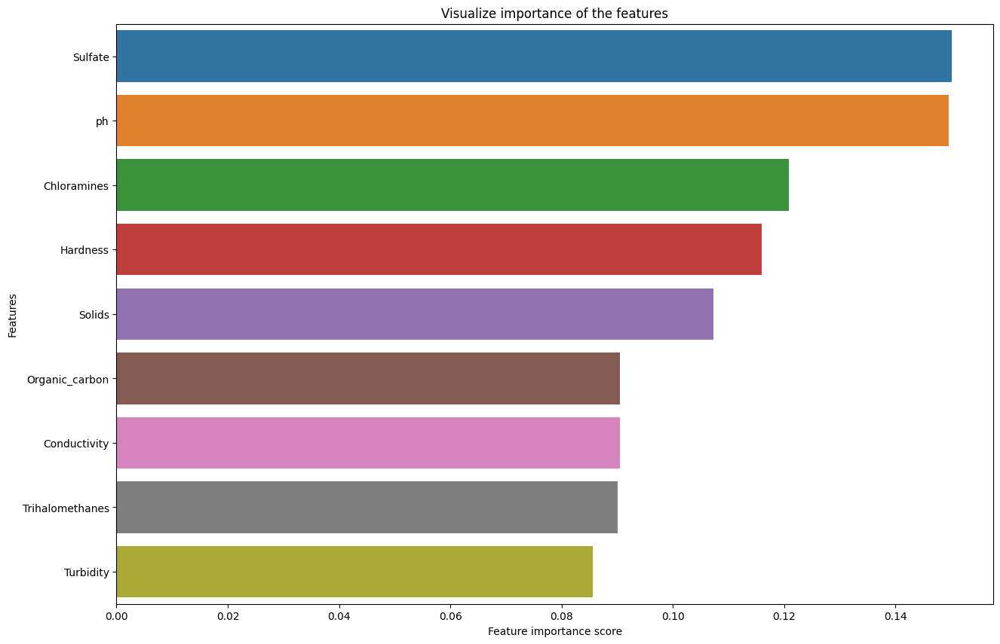

In [58]:
# 랜덤 포레스트 변수 중요도
forest_importances = pd.Series(rnd_clf.feature_importances_)
feature_scores = pd.Series(rnd_clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# 변수 중요도 seaborn bar plot
f, ax = plt.subplots(figsize=(15, 10))
ax = sns.barplot(x=feature_scores, y=feature_scores.index)
ax.set_title("Visualize importance of the features")
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
plt.show()

## 랜덤 포레스트 GridSearchCV

In [59]:
from sklearn.model_selection import GridSearchCV
start = time.time()
rnd_clf = RandomForestClassifier()
param_grid = { 'n_estimators':[100 , 200, 350, 500],
               'min_samples_leaf':[2, 5, 8]}

gscv_rnd = GridSearchCV(rnd_clf, param_grid,cv=5)
gscv_rnd.fit(X_train_ROS, y_train_ROS)
print("랜덤포레스트 최적 점수 : {}".format(gscv_rnd.best_score_))
print("랜덤포레스트 최적 파라미터 : {}".format(gscv_rnd.best_params_))

print(gscv_rnd.best_estimator_)
end = time.time() 
print('Execution time is:') 
print(end - start)

랜덤포레스트 최적 점수 : 0.7442708333333334
랜덤포레스트 최적 파라미터 : {'min_samples_leaf': 2, 'n_estimators': 500}
RandomForestClassifier(min_samples_leaf=2, n_estimators=500)
Execution time is:
108.27600312232971


# Light GBM

[1]	valid_0's binary_logloss: 0.67768	valid_0's binary_logloss: 0.67768
[2]	valid_0's binary_logloss: 0.662941	valid_0's binary_logloss: 0.662941
[3]	valid_0's binary_logloss: 0.651884	valid_0's binary_logloss: 0.651884
[4]	valid_0's binary_logloss: 0.641504	valid_0's binary_logloss: 0.641504
[5]	valid_0's binary_logloss: 0.632407	valid_0's binary_logloss: 0.632407
[6]	valid_0's binary_logloss: 0.624338	valid_0's binary_logloss: 0.624338
[7]	valid_0's binary_logloss: 0.616065	valid_0's binary_logloss: 0.616065
[8]	valid_0's binary_logloss: 0.606666	valid_0's binary_logloss: 0.606666
[9]	valid_0's binary_logloss: 0.600052	valid_0's binary_logloss: 0.600052
[10]	valid_0's binary_logloss: 0.598051	valid_0's binary_logloss: 0.598051
[11]	valid_0's binary_logloss: 0.591863	valid_0's binary_logloss: 0.591863
[12]	valid_0's binary_logloss: 0.588485	valid_0's binary_logloss: 0.588485
[13]	valid_0's binary_logloss: 0.586896	valid_0's binary_logloss: 0.586896
[14]	valid_0's binary_logloss: 0.582

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Light GBM >>')

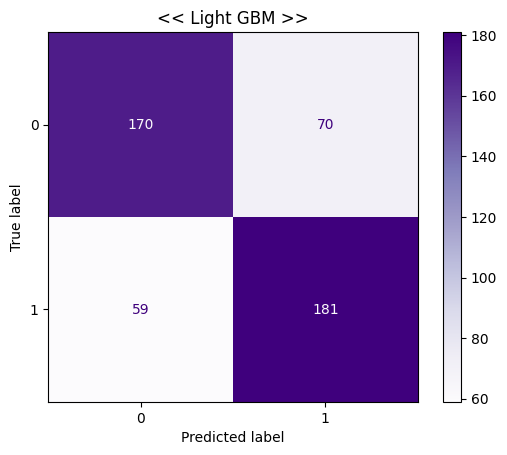

In [60]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(max_depth=20, n_estimators=1500, num_leaves=60, subsample=0.8)
# 조기 중단 기능에 필요한 파라미터 정의
evals = [(X_test_ROS, y_test_ROS)]
lgbm.fit(X_train_ROS, y_train_ROS, eval_metric='logloss', eval_set=evals, verbose=True)
lgbm_pred = lgbm.predict(X_test_ROS)
pred_proba = lgbm.predict_proba(X_test_ROS)[:,1]
lgbm_acc = lgbm.score(X_test_ROS, y_test_ROS)
print("Light GBM training accuracy :", lgbm.score(X_train_ROS, y_train_ROS)*100, "%")
print("Light GBM testing accuracy :", lgbm_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS, lgbm_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS, lgbm_pred))
print("--------------------------------------------------------------------------")
plot_confusion_matrix(lgbm, X_test_ROS, y_test_ROS, cmap='Purples')
end = time.time() 
print("--------------------------------------------------------------------------")
print('Execution time is:') 
print(end - start)
plt.title("<< Light GBM >>")

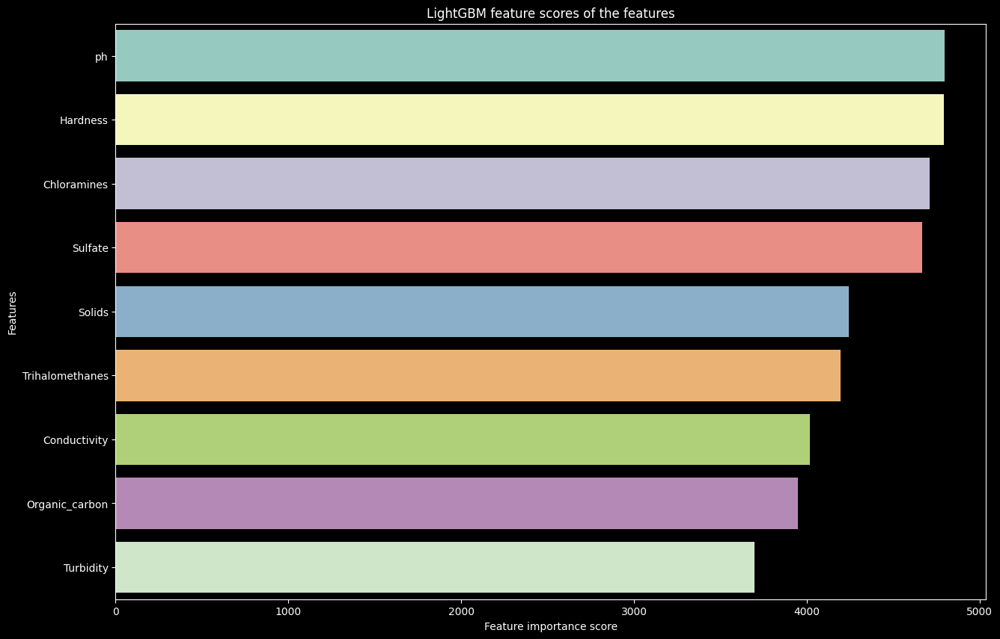

In [61]:
lgbm.feature_importances_
lgbm_feature_scores = pd.Series(lgbm.feature_importances_, index=X_train.columns).sort_values(ascending=False)
# Creating a seaborn bar plot
plt.style.use('dark_background')
f, ax = plt.subplots(figsize=(15, 10))
ax = sns.barplot(x=lgbm_feature_scores, y=lgbm_feature_scores.index)
ax.set_title("LightGBM feature scores of the features")
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
plt.show()

In [62]:
from sklearn.model_selection import GridSearchCV
import time
start = time.time()
lgbm = LGBMClassifier()
parameters = {'n_estimators':[1000, 1500],
              'learning_rate':[0.05, 0.1,  0.2],
              'num_leaves':[50, 60, 70],
              'max_depth': [10, 15, 20],
              'min_child_samples': [20, 40, 60],
              'subsample': [0.8, 1]} #Define the scoring
gscv_lgbm = GridSearchCV(lgbm, parameters, refit = True, scoring='accuracy') 
#gscv_lgbm.fit(X_train_ROS, y_train_ROS)
print("LightGBM 최적 점수 : {}".format(gscv_lgbm.best_score_))
print("LightGBM 최적 파라미터 : {}".format(gscv_lgbm.best_params_))
print(gscv_lgbm.best_estimator_)
end = time.time() 
print('Execution time is:') 
print(end - start)

AttributeError: ignored

# Gradient Boosting


Gradient Boosting training accuracy : 93.07291666666667 %
Gradient Boosting testing accuracy : 72.29166666666667 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.70      0.72       240
           1       0.71      0.74      0.73       240

    accuracy                           0.72       480
   macro avg       0.72      0.72      0.72       480
weighted avg       0.72      0.72      0.72       480

--------------------------------------------------------------------------
[[169  71]
 [ 62 178]]
--------------------------------------------------------------------------
--------------------------------------------------------------------------
Execution time is:
55.37877821922302


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Gradient Boosting >>')

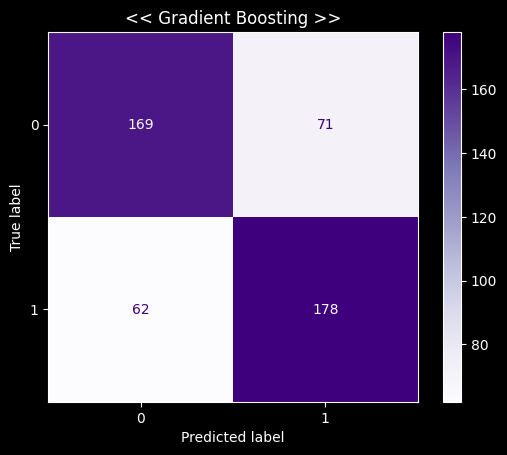

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

gbrt = GradientBoostingClassifier(n_estimators=500)
gbrt.fit(X_train_ROS, y_train_ROS)

errors = [mean_squared_error(y_test_ROS, y_pred)
          for y_pred in gbrt.staged_predict(X_test_ROS)]

end_n_estimators = np.argmin(errors) + 1
gbrt_end = GradientBoostingClassifier(n_estimators=end_n_estimators)
gbrt_end.fit(X_train_ROS, y_train_ROS)

gbrt_pred = gbrt_end.predict(X_test_ROS)
gbrt_acc = gbrt_end.score(X_test_ROS, y_test_ROS)
print("Gradient Boosting training accuracy :", gbrt_end.score(X_train_ROS, y_train_ROS)*100, "%")
print("Gradient Boosting testing accuracy :", gbrt_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS, gbrt_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS, gbrt_pred))
print("--------------------------------------------------------------------------")
plot_confusion_matrix(gbrt_end, X_test_ROS, y_test_ROS, cmap='Purples')
end = time.time() 
print("--------------------------------------------------------------------------")
print('Execution time is:') 
print(end - start)
plt.title("<< Gradient Boosting >>")

# 로지스틱 회귀

로지스틱 회귀 training accuracy : 52.03124999999999 %
로지스틱 회귀 testing accuracy : 49.583333333333336 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.50      0.52      0.51       240
           1       0.50      0.47      0.48       240

    accuracy                           0.50       480
   macro avg       0.50      0.50      0.50       480
weighted avg       0.50      0.50      0.50       480

--------------------------------------------------------------------------
[[125 115]
 [127 113]]
--------------------------------------------------------------------------
로지스틱 회귀 수행시간 :
0.05836939811706543


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Logistic Regression >>')

<Figure size 2000x2000 with 0 Axes>

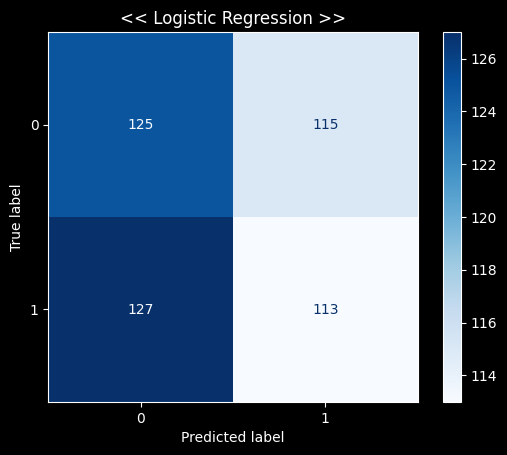

In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report,confusion_matrix, plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score , recall_score
### 로지스틱 회귀 ###
start = time.time()
#----------------------------------------------
lr = LogisticRegression(C=10, max_iter=10, random_state=0)
lr.fit( X_train_ROS, y_train_ROS )
lr_pred = lr.predict( X_test_ROS )
lr_acc = lr.score( X_test_ROS, y_test_ROS )
#----------------------------------------------
print("로지스틱 회귀 training accuracy :", lr.score( X_train_ROS, y_train_ROS )*100, "%")
print("로지스틱 회귀 testing accuracy :", lr_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report( y_test_ROS, lr_pred ))
print("--------------------------------------------------------------------------")
print(confusion_matrix( y_test_ROS, lr_pred ))
print("--------------------------------------------------------------------------")
#----------------------------------------------
end = time.time() 
print('로지스틱 회귀 수행시간 :') 
print(end - start)
plt.figure(figsize=(20, 20))
plot_confusion_matrix(lr , X_test_ROS , y_test_ROS , cmap='Blues')
plt.title("<< Logistic Regression >>")

In [68]:
from sklearn.model_selection import GridSearchCV 
from sklearn.linear_model import LogisticRegression
import numpy as np

lr = LogisticRegression( random_state = 0 )

params = {'C' : [0.1, 1, 10, 30, 50,
          'max_iter' : [10, 100, 1000],
          'penalty' : ["l1","l2"]
          }
lr_grid_cv = GridSearchCV(lr, param_grid=params, cv=3, scoring='accuracy', verbose=1)

SyntaxError: ignored

In [69]:
import time
start = time.time()
#----------------------------------------------
lr_grid_cv.fit( X_test_ROS , y_test_ROS)
print("로지스틱 최적 점수 : {}".format(lr_grid_cv.best_score_))
print("로지스틱 최적 파라미터 : {}".format(lr_grid_cv.best_params_))
print(lr_grid_cv.best_estimator_)
#----------------------------------------------
end = time.time() 
print("--------------------------------------------------------------------------")
print('Execution time is:') 
print(end - start)

NameError: ignored

# SVM

SVM training accuracy : 100.0 %
SVM testing accuracy : 74.79166666666667 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      1.00      0.80       240
           1       1.00      0.50      0.66       240

    accuracy                           0.75       480
   macro avg       0.83      0.75      0.73       480
weighted avg       0.83      0.75      0.73       480

--------------------------------------------------------------------------
[[240   0]
 [121 119]]
--------------------------------------------------------------------------
Execution time is:
0.7131955623626709


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



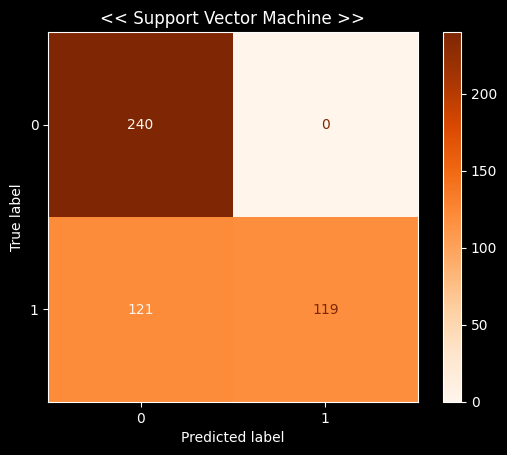

In [70]:
### 서포트 벡터 머신 ###
from sklearn.svm import SVC
import time
start = time.time()
#----------------------------------------------
svm_clf = SVC( C=1, gamma=10, random_state=0 )
svm_clf.fit( X_train_ROS, y_train_ROS )
svm_pred = svm_clf.predict( X_test_ROS )
svm_acc = svm_clf.score( X_test_ROS ,  y_test_ROS )
#----------------------------------------------
print("SVM training accuracy :", svm_clf.score( X_train_ROS , y_train_ROS )*100, "%")
print("SVM testing accuracy :", svm_acc * 100, "%")
#----------------------------------------------
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS , svm_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS , svm_pred))
print("--------------------------------------------------------------------------")
#----------------------------------------------
plot_confusion_matrix(svm_clf, X_test_ROS,  y_test_ROS, cmap='Oranges')
plt.title("<< Support Vector Machine >>")

end = time.time() 
print('Execution time is:') 
print(end - start)

In [71]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
start = time.time()
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 10, 30, 50, 70],
              'kernel': ['rbf']}
 
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)
 
# fitting the model for grid search
grid.fit(X_train_ROS, y_train_ROS)
end = time.time() 
print('Execution time is:', end - start) 

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.664 total time=   0.2s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.701 total time=   0.2s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.706 total time=   0.2s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.680 total time=   0.2s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.664 total time=   0.2s
[CV 1/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.547 total time=   0.2s
[CV 2/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.534 total time=   0.2s
[CV 3/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.523 total time=   0.2s
[CV 4/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.544 total time=   0.2s
[CV 5/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.536 total time=   0.2s
[CV 1/5] END .......C=0.1, gamma=30, kernel=rbf;, score=0.547 total time=   0.2s
[CV 2/5] END .......C=0.1, gamma=30, kernel=rbf

In [72]:
print("SVM 최적 점수 : {}".format(grid.best_score_))
print("SVM 최적 파라미터 : {}".format(grid.best_params_))
print(grid.best_estimator_)

SVM 최적 점수 : 0.7046875000000001
SVM 최적 파라미터 : {'C': 1, 'gamma': 10, 'kernel': 'rbf'}
SVC(C=1, gamma=10)


Naive Bayes training accuracy : 52.708333333333336 %
Naive Bayes testing accuracy : 47.708333333333336 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.48      0.48      0.48       240
           1       0.48      0.47      0.48       240

    accuracy                           0.48       480
   macro avg       0.48      0.48      0.48       480
weighted avg       0.48      0.48      0.48       480

--------------------------------------------------------------------------
[[115 125]
 [126 114]]
--------------------------------------------------------------------------
--------------------------------------------------------------------------
Execution time is:
0.13474035263061523


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



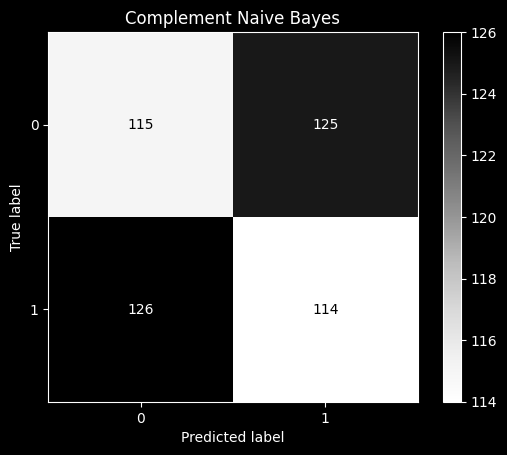

In [75]:
from sklearn.naive_bayes import BernoulliNB
import matplotlib.pyplot as plt
start = time.time()
nb_clf = BernoulliNB(alpha = 0.5)
nb_clf.fit( X_train_ROS, y_train_ROS )
nb_pred = nb_clf.predict( X_test_ROS )
nb_acc = nb_clf.score( X_test_ROS , y_test_ROS )
print("Naive Bayes training accuracy :", nb_clf.score( X_train_ROS, y_train_ROS )*100, "%")
print("Naive Bayes testing accuracy :", nb_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y_test_ROS, nb_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y_test_ROS, nb_pred))
print("--------------------------------------------------------------------------")
plot_confusion_matrix(nb_clf, X_test_ROS , y_test_ROS, cmap='Greys')
plt.title("Complement Naive Bayes")
end = time.time() 
print("--------------------------------------------------------------------------")
print('Execution time is:') 
print(end - start)

# 모델 평가

In [76]:
# 0413
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
models_acc = {'Logistic Regression': lr_acc*100,              
              'SVM': svm_acc*100, 
              'LighGBM':lgbm_acc*100 , 
              'Random Forest': rnd_clf_acc*100 
              }

models_acc_df = pd.DataFrame(pd.Series(models_acc))
models_acc_df.columns = ['정확도']
models_acc_df['모델'] = ['Logistic Regression', 'SVM', 
                          'LighGBM', 'Random Forest']
models_acc_df.set_index(pd.Index([1, 2 , 3 , 4 ]))

,정확도,모델
1,49.583333,Logistic Regression
2,74.791667,SVM
3,73.125000,LighGBM
4,74.166667,Random Forest


In [ ]:
!pip3 install plotly

Text(0.5, 1.0, '<< Classifier Accuracy Comparison >>')

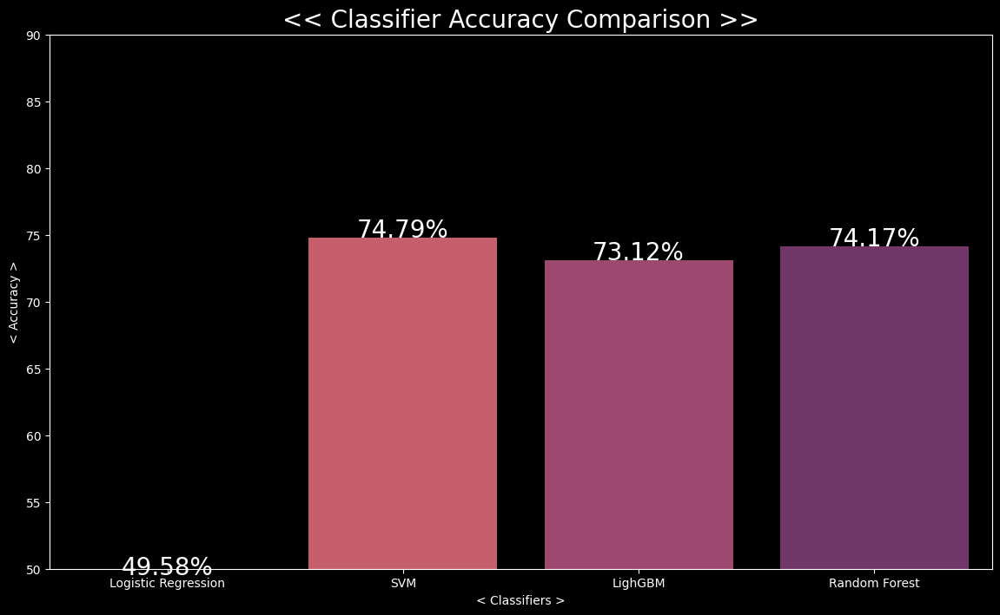

In [77]:
plt.figure(figsize=[14, 8])
axis = sns.barplot(x = '모델', y = '정확도', data = models_acc_df, palette="flare")
axis.set(xlabel='< Classifiers >', ylabel='< Accuracy >', ylim=(50, 90),)

for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.2f}%'.format(height), ha="center" ,fontsize = 20)

plt.title("<< Classifier Accuracy Comparison >>", fontsize = 20)

In [78]:
import plotly.express as px
fig = px.bar(models_acc_df, x='정확도', y='모델' ,color='모델', range_x=(50,90), template="plotly_white", text_auto='.4s',
            title="<<심화기계학습 최종 모델평가>> by 박성호" )
fig.update_traces(textfont_size=15, textangle=0, textposition="inside", cliponaxis=False)
fig.update_yaxes(categoryorder="total ascending")
fig.update_layout(height = 600, width = 1000, hovermode = 'closest')
fig.update_layout(coloraxis = {'colorscale':'Bluered_r'})

# Raw data로 다시 예측

In [79]:
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
...,...,...,...,...,...,...,...,...,...,...
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1


In [80]:
X #스케일링 확인

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3,0.782466,0.564114,0.011687,0.583804,0.574378,-0.783962,1.227032,2.111652,0.844761
4,1.275463,-0.455653,-0.455835,-0.370947,-0.560480,-0.348429,-0.842154,-2.140399,0.135033
5,-0.954835,-0.234614,0.790645,0.259104,-0.158911,-1.810063,-1.792340,-0.714423,-1.807366
6,1.994902,1.596951,0.790764,0.239248,1.467140,-1.770608,-0.170876,1.132494,-1.662163
7,0.985323,0.226606,-0.954313,-1.622878,-0.726179,0.595858,-0.599824,-0.224135,0.553348
...,...,...,...,...,...,...,...,...,...
3267,1.210411,0.584770,-0.693978,-0.528284,-0.492625,-0.447578,-1.341281,-0.705001,0.825626
3268,-0.243774,0.347964,-0.540564,0.362137,-0.697038,-1.205321,0.559422,-2.334474,-0.675183
3269,2.800492,-3.100365,1.767503,1.343596,-1.803476,0.165656,0.546021,-1.545585,0.512125
3270,-0.646160,-0.285317,0.488576,0.387023,0.302843,-0.131852,-0.688929,-0.372108,-0.384562


In [81]:
raw_X_train, raw_X_test, raw_y_train, raw_y_test = train_test_split(X, y, test_size=0.1, random_state=None, shuffle=True, stratify=y)
raw_X_test, raw_y_test 

(            ph  Hardness    Solids  Chloramines   Sulfate  Conductivity  \
 615  -0.519431 -0.314507  0.330097    -0.262980 -0.364043      1.338593   
 130  -0.281036 -1.350983 -1.274089    -2.136240 -2.240275      0.141061   
 1414 -2.222053  0.543545  1.332651    -1.004764 -0.603085      0.484602   
 2220  0.010462  1.454161  0.182368    -1.477886 -1.210837     -1.054468   
 382  -0.834912  0.533162  0.486973     0.944431 -1.455160      0.483724   
 ...        ...       ...       ...          ...       ...           ...   
 3257 -0.255967  2.333763 -0.338900    -1.134882  0.080846     -1.472273   
 1080  0.329182  0.573596 -1.210383     2.439784  1.594764     -1.306904   
 1593  0.308780 -0.703704 -1.514091     1.534794  2.501993     -1.495702   
 271   0.120741 -0.635906  0.084180     0.474946 -0.968926     -0.659054   
 2277 -0.331016 -1.666604 -1.046553     1.251340  0.186655     -1.072583   
 
       Organic_carbon  Trihalomethanes  Turbidity  
 615        -0.219258         0.17

In [82]:
# 업샘플링되지 않은 Raw data의 레이블의 클래스 빈도
raw_y_test.value_counts()

0    121
1     81
Name: Potability, dtype: int64

SVM testing accuracy : 95.54455445544554 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       121
           1       1.00      0.89      0.94        81

    accuracy                           0.96       202
   macro avg       0.97      0.94      0.95       202
weighted avg       0.96      0.96      0.95       202

--------------------------------------------------------------------------
[[121   0]
 [  9  72]]
--------------------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



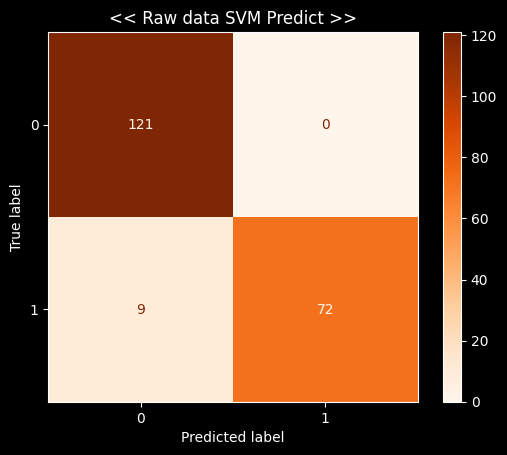

In [83]:
svm_pred = svm_clf.predict( raw_X_test )
svm_acc = svm_clf.score( raw_X_test ,  raw_y_test )
#----------------------------------------------
print("SVM testing accuracy :", svm_acc * 100, "%")
#----------------------------------------------
print("--------------------------------------------------------------------------")
print(classification_report(raw_y_test , svm_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(raw_y_test , svm_pred))
print("--------------------------------------------------------------------------")
#----------------------------------------------
plot_confusion_matrix(svm_clf, raw_X_test,  raw_y_test, cmap='Oranges')
plt.title("<< Raw data SVM Predict >>")
plt.style.use('dark_background')

# d


In [90]:
rnd_clf

RandomForestClassifier(random_state=0)

In [91]:
rnd_clf.predict( raw_X_test ) #X_test 예측

array([0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       1, 1, 1, 0])

랜덤포레스트 Raw data Prdict accuracy : 94.08254599701641 %
--------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1200
           1       0.92      0.93      0.93       811

    accuracy                           0.94      2011
   macro avg       0.94      0.94      0.94      2011
weighted avg       0.94      0.94      0.94      2011

--------------------------------------------------------------------------
[[1136   64]
 [  55  756]]
--------------------------------------------------------------------------
Execution time is:
22.231213569641113


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



Text(0.5, 1.0, '<< Predict Raw data (Random Forest) >>')

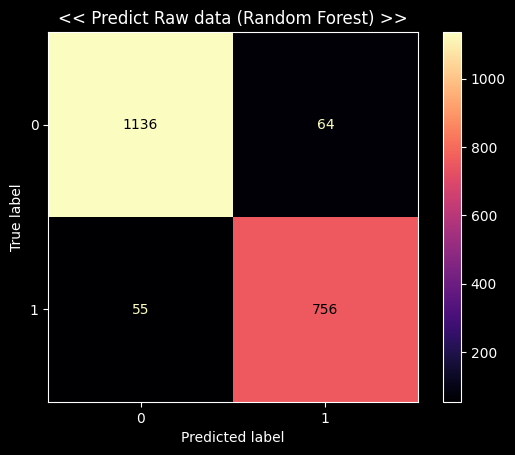

In [92]:
rnd_clf_pred = rnd_clf.predict( X ) #X_test 예측
rnd_clf_acc = rnd_clf.score( X , y ) # 정확도(Accuracy) 출력 
print("랜덤포레스트 Raw data Prdict accuracy :", rnd_clf_acc * 100, "%")
print("--------------------------------------------------------------------------")
print(classification_report(y, rnd_clf_pred))
print("--------------------------------------------------------------------------")
print(confusion_matrix(y, rnd_clf_pred))
print("--------------------------------------------------------------------------")
end = time.time() 
print('Execution time is:') 
print(end - start)
plot_confusion_matrix(rnd_clf, X, y, cmap='magma')
plt.title("<< Predict Raw data (Random Forest) >>")